<a href="https://colab.research.google.com/github/Katerina5649/ColabNotebooks/blob/master/Copy_of_classification_tutorial.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Catalyst classification tutorial

Authors: [Roman Tezikov](https://github.com/TezRomacH), [Sergey Kolesnikov](https://github.com/Scitator)

[![Catalyst logo](https://raw.githubusercontent.com/catalyst-team/catalyst-pics/master/pics/catalyst_logo.png)](https://github.com/catalyst-team/catalyst)

### Colab setup

First of all, do not forget to change the runtime type to GPU. <br/>
To do so click `Runtime` -> `Change runtime type` -> Select `"Python 3"` and `"GPU"` -> click `Save`. <br/>
After that you can click `Runtime` -> `Run` all and watch the tutorial.

## Requirements

Download and install the latest version of catalyst and other libraries required for this tutorial.

In [34]:
# this variable will be used in `runner.train` and by default we disable FP16 mode
is_fp16_used = False
is_alchemy_used = False

In [2]:
# for augmentations
!pip install -U albumentations

# for pretrained models for PyTorch
!pip install pretrainedmodels


################
# Catalyst itself
!pip install -U catalyst
# For specific version of catalyst, uncomment:
# ! pip install git+http://github.com/catalyst-team/catalyst.git@{master/commit_hash}
################

# for TTA
# !pip install ttach

# for tensorboard
!pip install tensorflow
%load_ext tensorboard

# for alchemy experiment logging integration, uncomment this 2 lines below
# !pip install -U alchemy
# is_alchemy_used = True

# if Your machine support Apex FP16, uncomment this 3 lines below
# !git clone https://github.com/NVIDIA/apex
# !pip install -v --no-cache-dir --global-option="--cpp_ext" --global-option="--cuda_ext" ./apex
# is_fp16_used = True

     |████████████████████████████████| 122kB 4.7MB/s 
     |████████████████████████████████| 634kB 14.9MB/s 
  Created wheel for albumentations: filename=albumentations-0.4.5-cp36-none-any.whl size=64378 sha256=98147456ede34e990009ca791acd3648bd3cb5bd180dcf78d1c3133b9dd28452
  Stored in directory: /root/.cache/pip/wheels/f0/a0/61/e50f93165a5ec7e7f5d65064e513239505bc4c06d2289557d3
  Created wheel for imgaug: filename=imgaug-0.2.6-cp36-none-any.whl size=654020 sha256=f8a08b761c0661cea16fe1e2a93059fd2925a8d122bfe03a8b569422caabc548
  Stored in directory: /root/.cache/pip/wheels/97/ec/48/0d25896c417b715af6236dbcef8f0bed136a1a5e52972fc6d0
Successfully built albumentations imgaug
  Found existing installation: imgaug 0.2.9
    Uninstalling imgaug-0.2.9:
      Successfully uninstalled imgaug-0.2.9
  Found existing installation: albumentations 0.1.12
    Uninstalling albumentations-0.1.12:
      Successfully uninstalled albumentations-0.1.12
     |████████████████████████████████| 61kB 3.0MB

In [3]:
!pip install -U albumentations
!pip install -U imageio

Requirement already up-to-date: albumentations in /usr/local/lib/python3.6/dist-packages (0.4.5)
     |████████████████████████████████| 3.3MB 4.9MB/s 
  Found existing installation: imageio 2.4.1
    Uninstalling imageio-2.4.1:
      Successfully uninstalled imageio-2.4.1


### Colab extras – Plotly

To intergate visualization library `plotly` to colab, run

In [35]:
import IPython

def configure_plotly_browser_state():
    display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))


IPython.get_ipython().events.register('pre_run_cell', configure_plotly_browser_state)

## Setting up GPUs

In [36]:
from typing import Callable, List, Tuple 

import os
import torch
import catalyst

from catalyst.dl import utils

print(f"torch: {torch.__version__}, catalyst: {catalyst.__version__}")

# os.environ["CUDA_VISIBLE_DEVICES"] = "0"  # "" - CPU, "0" - 1 GPU, "0,1" - MultiGPU

SEED = 42
utils.set_global_seed(SEED)
utils.prepare_cudnn(deterministic=True)

torch: 1.5.0+cu101, catalyst: 20.05.1


# Reproducibility

[![Alchemy logo](https://raw.githubusercontent.com/catalyst-team/catalyst-pics/master/pics/alchemy_logo.png)](https://github.com/catalyst-team/alchemy)

To make your research more reproducible and easy to monitor, Catalyst has an integration with [Alchemy](https://alchemy.host) – experiment tracking tool for deep learning.

To use monitoring, goto [Alchemy](https://alchemy.host/) and get your personal token.

In [6]:
# for alchemy experiment logging integration, uncomment this 2 lines below
# !pip install -U alchemy
# is_alchemy_used = True

In [37]:
if is_alchemy_used:
    monitoring_params = {
        "token": None, # insert your personal token here
        "project": "classification_example",
        "group": "first_trials",
        "experiment": "first_experiment",
    }
    assert monitoring_params["token"] is not None
else:
    monitoring_params = None

-------

## Dataset

As a dataset we will take [Best Artworks of All Time](https://www.kaggle.com/ikarus777/best-artworks-of-all-time) - collection of Paintings of the 50 Most Influential Artists of All Time.

> If you are on MacOS and you don’t have `wget`, you can install it with: `brew install wget`.

After Catalyst installation, `download-gdrive` function become available to download objects from Google Drive.
We use it to download datasets.

usage: `download-gdrive {FILE_ID} {FILENAME}`

In [8]:
%%bash

download-gdrive 1vB9A5WaQeU32-DBNa9YS5nR2ncTv2gEu train.zip
extract-archive train.zip &>/dev/null



--2020-05-28 18:53:48--  https://docs.google.com/uc?export=download&confirm=z8RU&id=1vB9A5WaQeU32-DBNa9YS5nR2ncTv2gEu
Resolving docs.google.com (docs.google.com)... 74.125.20.102, 74.125.20.138, 74.125.20.139, ...
Connecting to docs.google.com (docs.google.com)|74.125.20.102|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-14-6c-docs.googleusercontent.com/docs/securesc/dqklll35ukldk43j2uk7a7opp2vj29p4/ivrtvqo796vn9c3vapodsdnpl28sdm16/1590692025000/04303512257475502120/18378072640676460796Z/1vB9A5WaQeU32-DBNa9YS5nR2ncTv2gEu?e=download [following]
--2020-05-28 18:53:48--  https://doc-14-6c-docs.googleusercontent.com/docs/securesc/dqklll35ukldk43j2uk7a7opp2vj29p4/ivrtvqo796vn9c3vapodsdnpl28sdm16/1590692025000/04303512257475502120/18378072640676460796Z/1vB9A5WaQeU32-DBNa9YS5nR2ncTv2gEu?e=download
Resolving doc-14-6c-docs.googleusercontent.com (doc-14-6c-docs.googleusercontent.com)... 74.125.20.132, 2607:f8b0:400e:c07::84
Connecting to d

In [9]:
from pathlib import Path

ROOT = "train/"
ALL_IMAGES = list(Path(ROOT).glob("**/*.*"))
ALL_IMAGES = list(filter(lambda x: not x.name.startswith("."), ALL_IMAGES))
print("Number of images:", len(ALL_IMAGES))

Number of images: 1594


Let's check out the data!

In [10]:
from catalyst.utils import imread
import numpy as np

import matplotlib.pyplot as plt

def show_examples(images: List[Tuple[str, np.ndarray]]):
    _indexes = [(i, j) for i in range(2) for j in range(2)]
    
    f, ax = plt.subplots(2, 2, figsize=(16, 16))
    for (i, j), (title, img) in zip(_indexes, images):
        ax[i, j].imshow(img)
        ax[i, j].set_title(title)
    f.tight_layout()

def read_random_images(paths: List[Path]) -> List[Tuple[str, np.ndarray]]:
    data = np.random.choice(paths, size=4)
    result = []
    for d in data:
        title = f"{d.parent.name}: {d.name}"
        _image = imread(d)
        result.append((title, _image))
    
    return result

You can restart the cell below to see more examples.

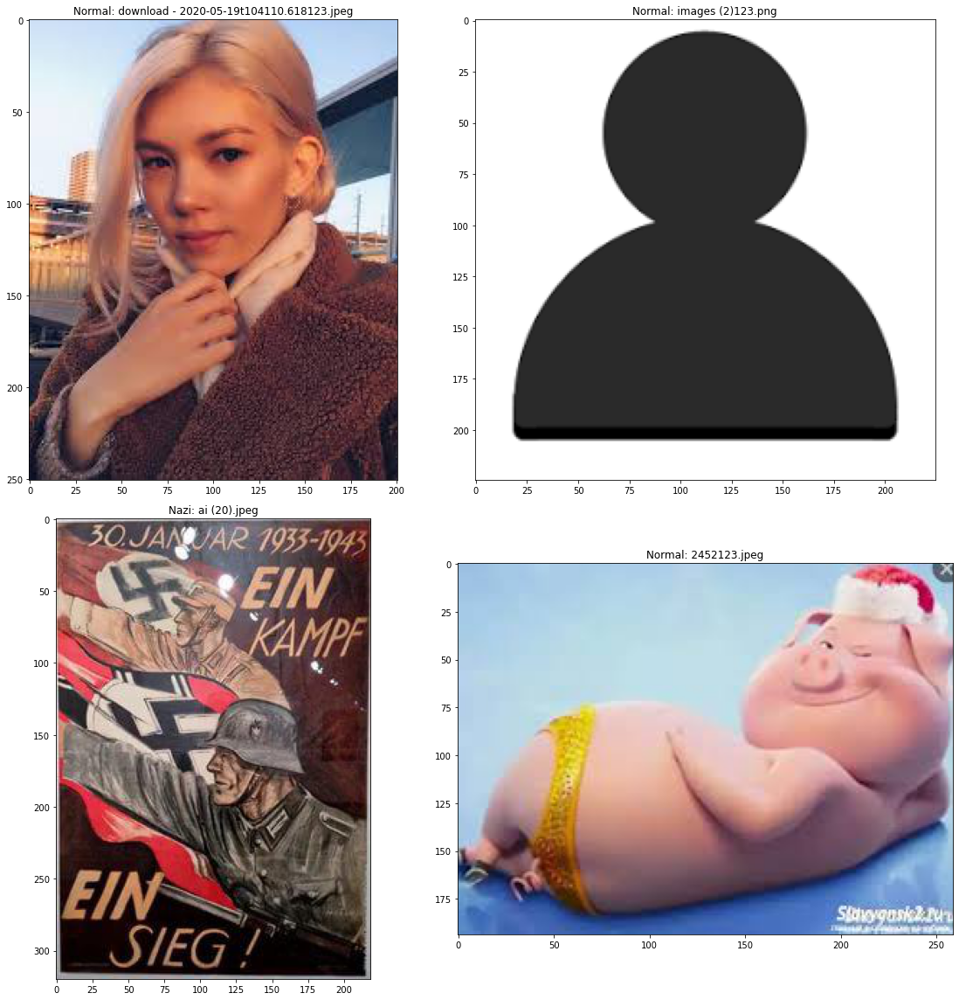

In [11]:
images = read_random_images(ALL_IMAGES)
show_examples(images)

## Dataset preprocessing

With Catalyst we can easily create a dataset from the following folder structure:
```
dataset/
    class_1/
        *.ext
        ...
    class_2/
        *.ext
        ...
    ...
    class_N/
        *.ext
        ...
```

First of all `create_dataset` function goes through a given directory and creates a dictionary `Dict[class_name, List[image]]`. <br/>
Then `create_dataframe` function creates typical `pandas.DataFrame` for further analysis. <br/>
After than `prepare_dataset_labeling` creates a numerical label for each unique class name. <br/>
Finally, to add a column with a numerical label value to the DataFrame, we can use `map_dataframe` function.

Additionaly let's save the `class_names` for further usage.

In [12]:
from catalyst.utils import (
    create_dataset, create_dataframe, get_dataset_labeling, map_dataframe
)

dataset = create_dataset(dirs=f"{ROOT}/*", extension="*.*")
df = create_dataframe(dataset, columns=["class", "filepath"])

tag_to_label = get_dataset_labeling(df, "class")
class_names = [
    name for name, id_ in sorted(tag_to_label.items(), key=lambda x: x[1])
]

df_with_labels = map_dataframe(
    df, 
    tag_column="class", 
    class_column="label", 
    tag2class=tag_to_label, 
    verbose=False
)
df_with_labels.head()

,class,filepath,label
0,Nazi,train/Nazi/1.png,0
1,Nazi,train/Nazi/100.jpg,0
2,Nazi,train/Nazi/101.png,0
3,Nazi,train/Nazi/102.jpg,0
4,Nazi,train/Nazi/103.jpg,0


Now let's divide our dataset into the `train` and` valid` parts. <br/>
The parameters for the split_dataframe function are the same as [sklearn.train_test_split](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html#sklearn-model-selection-train-test-split). <br/>
We also define `test_size` (it is optional) and `random_state` for reproducibility.

In [13]:
from catalyst.utils import split_dataframe_train_test

train_data, valid_data = split_dataframe_train_test(
    df_with_labels, test_size=0.2, random_state=SEED)
train_data, valid_data = (
    train_data.to_dict('records'), valid_data.to_dict('records')
)

In order to save your time during data preparation/reading/writing, Catalyst provides a special abstraction – [Reader](https://catalyst-team.github.io/catalyst/api/data.html#reader). <br/> 
Reader allows you to read various structures, for example, images, strings, numerical values and perform some functions on top of them.

In [14]:
from catalyst.contrib.data.cv import ImageReader
from catalyst.dl import utils
from catalyst.data import ScalarReader, ReaderCompose

num_classes = len(tag_to_label)

# ReaderCompose collects different Readers into one pipeline
open_fn = ReaderCompose([
    
    # Reads images from the `rootpath` folder 
    # using the key `input_key =" filepath "` (here should be the filename)
    # and writes it to the output dictionary by `output_key="features"` key
    ImageReader(
        input_key="filepath",
        output_key="features",
        rootpath=ROOT
    ),
    
    # Reads a number from our dataframe 
    # by the key `input_key =" label "` to np.long
    # and writes it to the output dictionary by `output_key="targets"` key
    ScalarReader(
        input_key="label",
        output_key="targets",
        default_value=-1,
        dtype=np.int64
    ),
    
    # Same as above, but with one encoding
    ScalarReader(
        input_key="label",
        output_key="targets_one_hot",
        default_value=-1,
        dtype=np.int64, 
        one_hot_classes=num_classes
    )
])

-------

## Augmentations

[![Albumentation logo](https://albumentations.readthedocs.io/en/latest/_static/logo.png)](https://github.com/albu/albumentations)

The [albumentation](https://github.com/albu/albumentations) library works with images and masks at the same time, which is what we need.

In [15]:
import albumentations as albu
from albumentations.pytorch import ToTensor

BORDER_CONSTANT = 0
BORDER_REFLECT = 2

def pre_transforms(image_size=224):
    # Convert the image to a square of size image_size x image_size
    # (keeping aspect ratio)
    result = [
        albu.LongestMaxSize(max_size=image_size),
        albu.PadIfNeeded(image_size, image_size, border_mode=BORDER_CONSTANT)
    ]
    
    return result

def hard_transforms():
    result = [
        # Random shifts, stretches and turns with a 50% probability
        albu.ShiftScaleRotate( 
            shift_limit=0.1,
            scale_limit=0.1,
            rotate_limit=15,
            border_mode=BORDER_REFLECT,
            p=0.5
        ),
        albu.IAAPerspective(scale=(0.02, 0.05), p=0.3),
        # Random brightness / contrast with a 30% probability
        albu.RandomBrightnessContrast(
            brightness_limit=0.2, contrast_limit=0.2, p=0.3
        ),
        # Random gamma changes with a 30% probability
        albu.RandomGamma(gamma_limit=(85, 115), p=0.3),
        # Randomly changes the hue, saturation, and color value of the input image
        albu.HueSaturationValue(p=0.3),
        albu.JpegCompression(quality_lower=80),
    ]
    
    return result

def post_transforms():
    # we use ImageNet image normalization
    # and convert it to torch.Tensor
    return [albu.Normalize(), ToTensor()]

def compose(transforms_to_compose):
    # combine all augmentations into one single pipeline
    result = albu.Compose([
      item for sublist in transforms_to_compose for item in sublist
    ])
    return result

Like Reader, there is a close abstraction for handling augmentations and key-value-based dataloaders – [Augmentor](https://catalyst-team.github.io/catalyst/api/data.html#augmentor).

In [16]:
from catalyst.data import Augmentor


train_transforms = compose([
    pre_transforms(), 
    hard_transforms(), 
    post_transforms()
])
valid_transforms = compose([pre_transforms(), post_transforms()])

show_transforms = compose([pre_transforms(), hard_transforms()])

# Takes an image from the input dictionary by the key `dict_key` 
# and performs `train_transforms` on it.
train_data_transforms = Augmentor(
    dict_key="features",
    augment_fn=lambda x: train_transforms(image=x)["image"]
)


# Similarly for the validation part of the dataset. 
# we only perform squaring, normalization and ToTensor
valid_data_transforms = Augmentor(
    dict_key="features",
    augment_fn=lambda x: valid_transforms(image=x)["image"]
)

/usr/local/lib/python3.6/dist-packages/albumentations/augmentations/transforms.py:1662: DeprecationWarning:

This class has been deprecated. Please use ImageCompression

/usr/local/lib/python3.6/dist-packages/albumentations/pytorch/transforms.py:59: DeprecationWarning:

ToTensor is deprecated and will be replaced by ToTensorV2 in albumentations 0.5.0



Let's look at the augmented results. <br/>
You can restart the cell below to see more examples of augmentations.

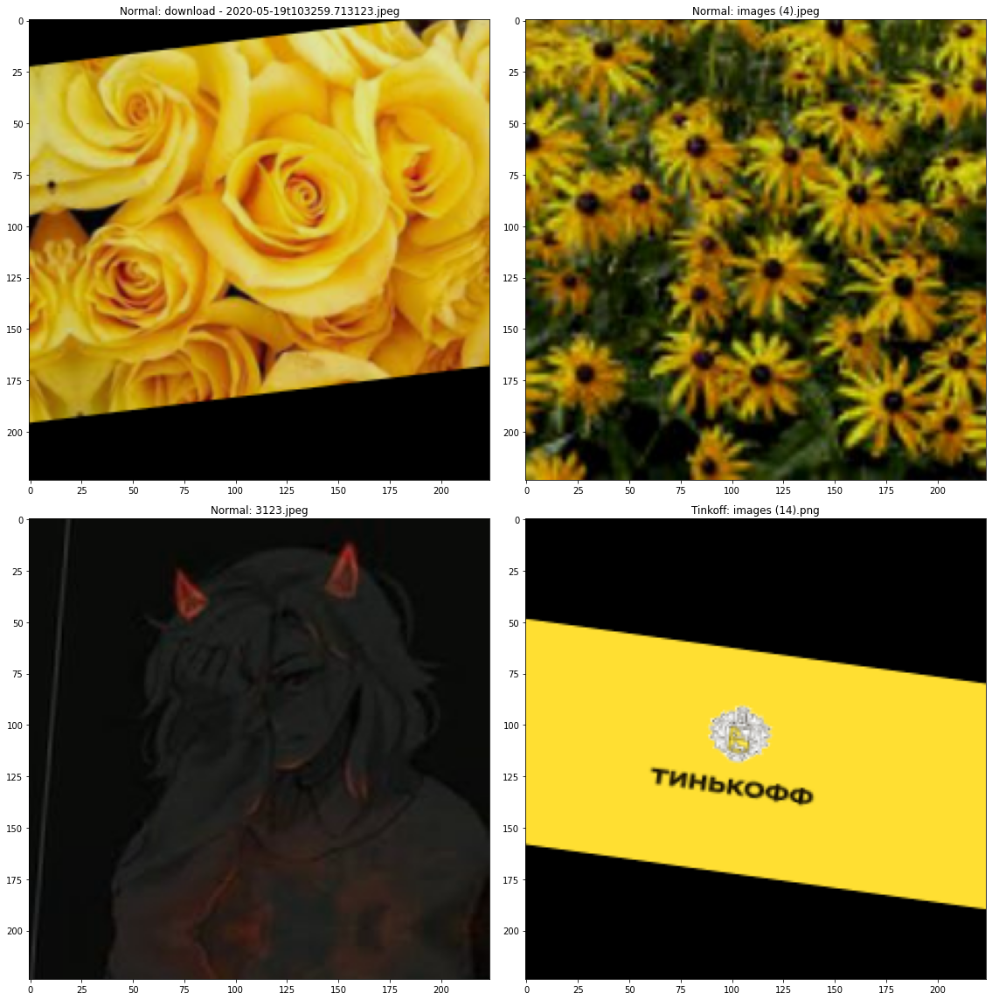

In [17]:
images = read_random_images(ALL_IMAGES)

images = [
    (title, show_transforms(image=i)["image"])
    for (title, i) in images
]
show_examples(images)

-------

## Loaders

Using `catalyst.utils.get_loader`, you can immediately get loaders only from the dataset and data-converting functions.

In [18]:
import collections

def get_loaders(
    open_fn: Callable,
    train_transforms_fn,
    valid_transforms_fn,
    batch_size: int = 64, 
    num_workers: int = 4,
    sampler = None
) -> collections.OrderedDict:
    """
    Args:
        open_fn: Reader for reading data from a dataframe
        train_transforms_fn: Augmentor for train part
        valid_transforms_fn: Augmentor for valid part
        batch_size: batch size
        num_workers: How many subprocesses to use to load data,
        sampler: An object of the torch.utils.data.Sampler class 
            for the dataset data sampling strategy specification
    """
    train_loader = utils.get_loader(
        train_data,
        open_fn=open_fn,
        dict_transform=train_transforms_fn,
        batch_size=batch_size,
        num_workers=num_workers,
        shuffle=sampler is None, # shuffle data only if Sampler is not specified (PyTorch requirement)
        sampler=sampler,
        drop_last=True,
    )

    valid_loader = utils.get_loader(
        valid_data,
        open_fn=open_fn,
        dict_transform=valid_transforms_fn,
        batch_size=batch_size,
        num_workers=num_workers,
        shuffle=False, 
        sampler=None,
        drop_last=True,
    )

    # Catalyst expects an ordered dictionary with train/valid/infer loaders. 
    # The number of loaders can vary.
    # For example, it can easily handle even some complex logic like:
    # loaders["train_dataset1"] = train_loader_1
    # loaders["train_dataset2"] = train_loader_2
    # ....
    # loaders["valid_1"] = valid_loader_1
    # loaders["valid_2"] = valid_loader_2
    # ...
    # loaders["infer_1"] = infer_loader_1
    # loaders["infer_2"] = infer_loader_2
    # ...
    
    loaders = collections.OrderedDict()
    loaders["train"] = train_loader
    loaders["valid"] = valid_loader

    return loaders

if is_fp16_used:
    batch_size = 128
else:
  # было 64
    batch_size = 10

print(f"batch_size: {batch_size}")

loaders = get_loaders(
    open_fn=open_fn, 
    train_transforms_fn=train_data_transforms,
    valid_transforms_fn=valid_data_transforms,
    batch_size=batch_size,
)


batch_size: 10


-------

## Experiment
### Model

Let's take the classification model from [Cadene pretrain models](https://github.com/Cadene/pretrained-models.pytorch). This repository contains a huge number of pre-trained PyTorch models.

In [38]:
from torch import nn
import pretrainedmodels


def get_model(model_name: str, num_classes: int, pretrained: str = "imagenet"):
    model_fn = pretrainedmodels.__dict__[model_name]
    model = model_fn(num_classes=1000, pretrained=pretrained)
    
    model.fc = nn.Sequential()
    dim_feats = model.last_linear.in_features
    model.last_linear = nn.Linear(dim_feats, num_classes)

    return model


model_name = "resnet18"
model = get_model(model_name, num_classes)

### Model training

In [39]:
import torch

# as we are working on basic classification problem (no multi-class/multi-label)
# let's use standard CE loss
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.0003)
scheduler = torch.optim.lr_scheduler.MultiStepLR(
    optimizer, milestones=[9], gamma=0.3
)

To run some DL experiment, Catalyst uses a [Runner](https://catalyst-team.github.io/catalyst/api/dl.html#catalyst.dl.core.runner.Runner) abstraction. <br/>
It contains main logic about "how" you run the experiment and getting predictions.

For supervised learning case, there is an extention for Runner – [SupervisedRunner](https://catalyst-team.github.io/catalyst/api/dl.html#module-catalyst.dl.runner.supervised), which provides additional methods like `train`, `infer` and `predict_loader`.

In [21]:
from catalyst.dl import SupervisedRunner

num_epochs = 10
logdir = "./logs/classification"

device = utils.get_device()
print(f"device: {device}")

if is_fp16_used:
    fp16_params = dict(opt_level="O1") # params for FP16
else:
    fp16_params = None

print(f"FP16 params: {fp16_params}")

runner = SupervisedRunner(device=device)

device: cuda
FP16 params: None


Using [Callbacks](https://catalyst-team.github.io/catalyst/api/dl.html#catalyst.dl.core.callback.Callback), the basic functionality of the catalyst can be expanded.

A callback is a class inherited from `catalyst.dl.core.Callback` and implements one / several / all methods:

```
on_stage_start
    --- on_epoch_start
    ------ on_loader_start
    --------- on_batch_start
    --------- on_batch_end
    ------ on_loader_end
    --- on_epoch_end
on_stage_end

on_exception - if the code crashes with an error, you can catch it and reserve the parameters you need
```

You can find the list of standard callbacks [here](https://catalyst-team.github.io/catalyst/api/dl.html#module-catalyst.dl.callbacks.checkpoint). 
It includes callbacks such as
- CheckpointCallback. Saves N best models in logdir
- TensorboardLogger. Logs all metrics to tensorboard
- EarlyStoppingCallback. Early training stop if metrics do not improve for the `patience` of epochs
- ConfusionMatrixCallback. Plots ConfusionMatrix per epoch in tensorboard

Many different metrics for classfication
- AccuracyCallback
- MapKCallback
- AUCCallback
- F1ScoreCallback

segmentation
- DiceCallback
- IouCallback

and many other callbacks, like LRFinder and MixupCallback

### Monitoring in tensorboard

If you do not have a Tensorboard opened after you have run the cell below, try running the cell again.

In [22]:
%tensorboard --logdir {logdir}

<IPython.core.display.Javascript object>

/usr/lib/python3.6/subprocess.py:786: ResourceWarning:

subprocess 362 is still running



### Running train-loop

Проверим, что все картинки читаются

In [23]:
    reader_ = ImageReader(
        input_key="filepath",
        output_key="features",
        rootpath=ROOT
    )

In [24]:
for x in train_data:
  try:
     reader_(x)
  except TypeError :
      print("не читается " + str(x))


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning:

Palette images with Transparency expressed in bytes should be converted to RGBA images



In [25]:
# as we are working on classification task
from catalyst.dl.callbacks import AccuracyCallback, AUCCallback, F1ScoreCallback

callbacks = [
    AccuracyCallback(num_classes=num_classes),
    AUCCallback(
        num_classes=num_classes,
        input_key="targets_one_hot",
        class_names=class_names
    ),
    F1ScoreCallback(
        input_key="targets_one_hot",
        activation="Softmax"
    )
]

if is_alchemy_used:
    from catalyst.dl import AlchemyLogger
    callbacks.append(AlchemyLogger(**monitoring_params))

runner.train(
    model=model,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    # our dataloaders
    loaders=loaders,
    # We can specify the callbacks list for the experiment;
    # For this task, we will check accuracy, AUC and F1 metrics
    callbacks=callbacks,
    # path to save logs
    logdir=logdir,
    num_epochs=num_epochs,
    # save our best checkpoint by AUC metric
    main_metric="auc/_mean",
    # AUC needs to be maximized.
    minimize_metric=False,
    # for FP16. It uses the variable from the very first cell
    fp16=fp16_params,
    # prints train logs
    verbose=True,
)

1/10 * Epoch (train):   0% 0/127 [00:00<?, ?it/s]

/usr/local/lib/python3.6/dist-packages/catalyst/utils/metrics/f1_score.py:32: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



1/10 * Epoch (train):  27% 34/127 [00:03<00:07, 12.72it/s, accuracy01=0.900, f1_score=0.817, loss=0.233]

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning:

Palette images with Transparency expressed in bytes should be converted to RGBA images



1/10 * Epoch (train): 100% 127/127 [00:10<00:00, 11.88it/s, accuracy01=0.900, f1_score=0.822, loss=0.336]
1/10 * Epoch (valid):   6% 2/31 [00:00<00:07,  4.00it/s, accuracy01=1.000, f1_score=0.947, loss=0.057]

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning:

Palette images with Transparency expressed in bytes should be converted to RGBA images



1/10 * Epoch (valid): 100% 31/31 [00:01<00:00, 15.54it/s, accuracy01=0.900, f1_score=0.875, loss=0.166]
[2020-05-28 18:54:31,726] 
1/10 * Epoch 1 (_base): lr=0.0003 | momentum=0.9000
1/10 * Epoch 1 (train): accuracy01=0.8567 | auc/_mean=0.9510 | auc/class_Nazi=0.9442 | auc/class_Normal=0.9309 | auc/class_Tinkoff=0.9781 | f1_score=0.8094 | loss=0.3947
1/10 * Epoch 1 (valid): accuracy01=0.8871 | auc/_mean=0.9526 | auc/class_Nazi=0.9414 | auc/class_Normal=0.9220 | auc/class_Tinkoff=0.9944 | f1_score=0.8562 | loss=0.3802


/usr/local/lib/python3.6/dist-packages/torch/optim/lr_scheduler.py:396: UserWarning:

To get the last learning rate computed by the scheduler, please use `get_last_lr()`.



2/10 * Epoch (train):   6% 7/127 [00:00<00:29,  4.06it/s, accuracy01=0.900, f1_score=0.870, loss=0.164]

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning:

Palette images with Transparency expressed in bytes should be converted to RGBA images



2/10 * Epoch (train): 100% 127/127 [00:10<00:00, 12.03it/s, accuracy01=0.900, f1_score=0.805, loss=0.514]
2/10 * Epoch (valid):   6% 2/31 [00:00<00:10,  2.78it/s, accuracy01=0.900, f1_score=0.842, loss=0.312]

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning:

Palette images with Transparency expressed in bytes should be converted to RGBA images



2/10 * Epoch (valid): 100% 31/31 [00:01<00:00, 15.79it/s, accuracy01=0.700, f1_score=0.766, loss=0.502]
[2020-05-28 18:54:45,818] 
2/10 * Epoch 2 (_base): lr=0.0003 | momentum=0.9000
2/10 * Epoch 2 (train): accuracy01=0.9094 | auc/_mean=0.9719 | auc/class_Nazi=0.9642 | auc/class_Normal=0.9584 | auc/class_Tinkoff=0.9929 | f1_score=0.8715 | loss=0.2505
2/10 * Epoch 2 (valid): accuracy01=0.8839 | auc/_mean=0.9771 | auc/class_Nazi=0.9645 | auc/class_Normal=0.9681 | auc/class_Tinkoff=0.9988 | f1_score=0.8499 | loss=0.3201
3/10 * Epoch (train):  22% 28/127 [00:02<00:06, 14.42it/s, accuracy01=0.900, f1_score=0.869, loss=0.187]

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning:

Palette images with Transparency expressed in bytes should be converted to RGBA images



3/10 * Epoch (train): 100% 127/127 [00:10<00:00, 12.13it/s, accuracy01=0.700, f1_score=0.721, loss=0.743]
3/10 * Epoch (valid):   6% 2/31 [00:00<00:10,  2.78it/s, accuracy01=1.000, f1_score=0.956, loss=0.048]

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning:

Palette images with Transparency expressed in bytes should be converted to RGBA images



3/10 * Epoch (valid): 100% 31/31 [00:01<00:00, 15.69it/s, accuracy01=1.000, f1_score=0.922, loss=0.089]
[2020-05-28 18:54:59,783] 
3/10 * Epoch 3 (_base): lr=0.0003 | momentum=0.9000
3/10 * Epoch 3 (train): accuracy01=0.9417 | auc/_mean=0.9831 | auc/class_Nazi=0.9793 | auc/class_Normal=0.9724 | auc/class_Tinkoff=0.9976 | f1_score=0.9056 | loss=0.1704
3/10 * Epoch 3 (valid): accuracy01=0.9452 | auc/_mean=0.9814 | auc/class_Nazi=0.9797 | auc/class_Normal=0.9649 | auc/class_Tinkoff=0.9996 | f1_score=0.8980 | loss=0.1827
4/10 * Epoch (train):  14% 18/127 [00:01<00:11,  9.36it/s, accuracy01=0.900, f1_score=0.883, loss=0.162]

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning:

Palette images with Transparency expressed in bytes should be converted to RGBA images



4/10 * Epoch (train): 100% 127/127 [00:11<00:00, 11.54it/s, accuracy01=1.000, f1_score=0.967, loss=0.037]
4/10 * Epoch (valid):   6% 2/31 [00:00<00:10,  2.66it/s, accuracy01=1.000, f1_score=0.992, loss=0.008]

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning:

Palette images with Transparency expressed in bytes should be converted to RGBA images



4/10 * Epoch (valid): 100% 31/31 [00:01<00:00, 15.64it/s, accuracy01=1.000, f1_score=0.967, loss=0.035]
[2020-05-28 18:55:14,801] 
4/10 * Epoch 4 (_base): lr=0.0003 | momentum=0.9000
4/10 * Epoch 4 (train): accuracy01=0.9606 | auc/_mean=0.9906 | auc/class_Nazi=0.9853 | auc/class_Normal=0.9873 | auc/class_Tinkoff=0.9991 | f1_score=0.9312 | loss=0.1153
4/10 * Epoch 4 (valid): accuracy01=0.9258 | auc/_mean=0.9738 | auc/class_Nazi=0.9430 | auc/class_Normal=0.9786 | auc/class_Tinkoff=0.9998 | f1_score=0.8891 | loss=0.2253
5/10 * Epoch (train):  34% 43/127 [00:03<00:07, 11.87it/s, accuracy01=0.800, f1_score=0.799, loss=0.463]

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning:

Palette images with Transparency expressed in bytes should be converted to RGBA images



5/10 * Epoch (train): 100% 127/127 [00:10<00:00, 12.16it/s, accuracy01=1.000, f1_score=0.947, loss=0.061]
5/10 * Epoch (valid):  13% 4/31 [00:00<00:06,  4.36it/s, accuracy01=1.000, f1_score=1.000, loss=7.858e-05]

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning:

Palette images with Transparency expressed in bytes should be converted to RGBA images



5/10 * Epoch (valid): 100% 31/31 [00:01<00:00, 15.59it/s, accuracy01=1.000, f1_score=0.949, loss=0.057]
[2020-05-28 18:55:28,134] 
5/10 * Epoch 5 (_base): lr=0.0003 | momentum=0.9000
5/10 * Epoch 5 (train): accuracy01=0.9622 | auc/_mean=0.9886 | auc/class_Nazi=0.9886 | auc/class_Normal=0.9812 | auc/class_Tinkoff=0.9961 | f1_score=0.9316 | loss=0.1316
5/10 * Epoch 5 (valid): accuracy01=0.9613 | auc/_mean=0.9934 | auc/class_Nazi=0.9944 | auc/class_Normal=0.9861 | auc/class_Tinkoff=0.9998 | f1_score=0.9340 | loss=0.1249
6/10 * Epoch (train):  13% 17/127 [00:01<00:13,  8.22it/s, accuracy01=0.900, f1_score=0.902, loss=0.133]

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning:

Palette images with Transparency expressed in bytes should be converted to RGBA images



6/10 * Epoch (train): 100% 127/127 [00:10<00:00, 12.02it/s, accuracy01=0.900, f1_score=0.888, loss=0.311]
6/10 * Epoch (valid):  26% 8/31 [00:00<00:05,  3.94it/s, accuracy01=0.900, f1_score=0.828, loss=0.302]

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning:

Palette images with Transparency expressed in bytes should be converted to RGBA images



6/10 * Epoch (valid): 100% 31/31 [00:02<00:00, 15.36it/s, accuracy01=1.000, f1_score=0.928, loss=0.086]
[2020-05-28 18:55:42,140] 
6/10 * Epoch 6 (_base): lr=0.0003 | momentum=0.9000
6/10 * Epoch 6 (train): accuracy01=0.9551 | auc/_mean=0.9904 | auc/class_Nazi=0.9888 | auc/class_Normal=0.9846 | auc/class_Tinkoff=0.9978 | f1_score=0.9309 | loss=0.1247
6/10 * Epoch 6 (valid): accuracy01=0.9452 | auc/_mean=0.9750 | auc/class_Nazi=0.9706 | auc/class_Normal=0.9545 | auc/class_Tinkoff=0.9998 | f1_score=0.9088 | loss=0.1684
7/10 * Epoch (train):  89% 113/127 [00:09<00:01, 13.46it/s, accuracy01=1.000, f1_score=0.984, loss=0.016]

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning:

Palette images with Transparency expressed in bytes should be converted to RGBA images



7/10 * Epoch (train): 100% 127/127 [00:10<00:00, 12.03it/s, accuracy01=1.000, f1_score=0.989, loss=0.011]
7/10 * Epoch (valid):   6% 2/31 [00:00<00:10,  2.81it/s, accuracy01=1.000, f1_score=0.951, loss=0.056]

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning:

Palette images with Transparency expressed in bytes should be converted to RGBA images



7/10 * Epoch (valid): 100% 31/31 [00:01<00:00, 15.61it/s, accuracy01=1.000, f1_score=0.973, loss=0.030]
[2020-05-28 18:55:55,477] 
7/10 * Epoch 7 (_base): lr=0.0003 | momentum=0.9000
7/10 * Epoch 7 (train): accuracy01=0.9669 | auc/_mean=0.9905 | auc/class_Nazi=0.9890 | auc/class_Normal=0.9853 | auc/class_Tinkoff=0.9971 | f1_score=0.9398 | loss=0.1061
7/10 * Epoch 7 (valid): accuracy01=0.9710 | auc/_mean=0.9942 | auc/class_Nazi=0.9941 | auc/class_Normal=0.9900 | auc/class_Tinkoff=0.9986 | f1_score=0.9428 | loss=0.1243
8/10 * Epoch (train):  47% 60/127 [00:05<00:05, 13.18it/s, accuracy01=1.000, f1_score=0.983, loss=0.018]

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning:

Palette images with Transparency expressed in bytes should be converted to RGBA images



8/10 * Epoch (train): 100% 127/127 [00:10<00:00, 12.28it/s, accuracy01=1.000, f1_score=0.977, loss=0.023]
8/10 * Epoch (valid):  13% 4/31 [00:00<00:05,  4.61it/s, accuracy01=0.900, f1_score=0.851, loss=0.336]

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning:

Palette images with Transparency expressed in bytes should be converted to RGBA images



8/10 * Epoch (valid): 100% 31/31 [00:01<00:00, 15.81it/s, accuracy01=1.000, f1_score=0.900, loss=0.121]
[2020-05-28 18:56:09,266] 
8/10 * Epoch 8 (_base): lr=0.0003 | momentum=0.9000
8/10 * Epoch 8 (train): accuracy01=0.9677 | auc/_mean=0.9932 | auc/class_Nazi=0.9916 | auc/class_Normal=0.9911 | auc/class_Tinkoff=0.9970 | f1_score=0.9449 | loss=0.1005
8/10 * Epoch 8 (valid): accuracy01=0.9000 | auc/_mean=0.9786 | auc/class_Nazi=0.9836 | auc/class_Normal=0.9527 | auc/class_Tinkoff=0.9996 | f1_score=0.8769 | loss=0.2934
9/10 * Epoch (train):   4% 5/127 [00:00<00:38,  3.20it/s, accuracy01=0.800, f1_score=0.840, loss=0.366]

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning:

Palette images with Transparency expressed in bytes should be converted to RGBA images



9/10 * Epoch (train): 100% 127/127 [00:10<00:00, 12.49it/s, accuracy01=0.900, f1_score=0.909, loss=0.131]
9/10 * Epoch (valid):  26% 8/31 [00:00<00:03,  6.37it/s, accuracy01=1.000, f1_score=0.995, loss=0.005]

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning:

Palette images with Transparency expressed in bytes should be converted to RGBA images



9/10 * Epoch (valid): 100% 31/31 [00:01<00:00, 15.57it/s, accuracy01=0.900, f1_score=0.925, loss=0.101]
[2020-05-28 18:56:22,254] 
9/10 * Epoch 9 (_base): lr=2.700e-05 | momentum=0.9000
9/10 * Epoch 9 (train): accuracy01=0.9709 | auc/_mean=0.9940 | auc/class_Nazi=0.9918 | auc/class_Normal=0.9907 | auc/class_Tinkoff=0.9996 | f1_score=0.9480 | loss=0.0842
9/10 * Epoch 9 (valid): accuracy01=0.9484 | auc/_mean=0.9920 | auc/class_Nazi=0.9866 | auc/class_Normal=0.9893 | auc/class_Tinkoff=1.0000 | f1_score=0.9417 | loss=0.1459
10/10 * Epoch (train):   0% 0/127 [00:00<?, ?it/s]

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning:

Palette images with Transparency expressed in bytes should be converted to RGBA images



10/10 * Epoch (train): 100% 127/127 [00:11<00:00, 11.39it/s, accuracy01=0.800, f1_score=0.826, loss=0.327]
10/10 * Epoch (valid):  10% 3/31 [00:00<00:07,  3.63it/s, accuracy01=1.000, f1_score=0.994, loss=0.006]

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning:

Palette images with Transparency expressed in bytes should be converted to RGBA images



10/10 * Epoch (valid): 100% 31/31 [00:02<00:00, 15.35it/s, accuracy01=1.000, f1_score=0.988, loss=0.012]
[2020-05-28 18:56:36,266] 
10/10 * Epoch 10 (_base): lr=9.000e-05 | momentum=0.9000
10/10 * Epoch 10 (train): accuracy01=0.9890 | auc/_mean=0.9982 | auc/class_Nazi=0.9976 | auc/class_Normal=0.9970 | auc/class_Tinkoff=0.9999 | f1_score=0.9788 | loss=0.0424
10/10 * Epoch 10 (valid): accuracy01=0.9484 | auc/_mean=0.9963 | auc/class_Nazi=0.9943 | auc/class_Normal=0.9945 | auc/class_Tinkoff=1.0000 | f1_score=0.9487 | loss=0.1083
Top best models:
logs/classification/checkpoints/train.10.pth	0.9963


In [26]:
#torch.save(model.state_dict(), 'Catalyst_1_weights')

## Загрузим модель

In [40]:
%%bash

download-gdrive 1YfciK5Ix1jun8kZ-G4FZfO-1R9akhdzP CatalystModelWeigh_3.0

--2020-05-28 19:02:42--  https://docs.google.com/uc?export=download&confirm=&id=1YfciK5Ix1jun8kZ-G4FZfO-1R9akhdzP
Resolving docs.google.com (docs.google.com)... 74.125.197.100, 74.125.197.139, 74.125.197.102, ...
Connecting to docs.google.com (docs.google.com)|74.125.197.100|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-08-9g-docs.googleusercontent.com/docs/securesc/44089mtnmpthtv1ts85ih5h1il75oa6t/m3ood52mqve5ovg2l60l36t111kh1o3g/1590692550000/04303512257475502120/00634572620676705497Z/1YfciK5Ix1jun8kZ-G4FZfO-1R9akhdzP?e=download [following]
--2020-05-28 19:02:44--  https://doc-08-9g-docs.googleusercontent.com/docs/securesc/44089mtnmpthtv1ts85ih5h1il75oa6t/m3ood52mqve5ovg2l60l36t111kh1o3g/1590692550000/04303512257475502120/00634572620676705497Z/1YfciK5Ix1jun8kZ-G4FZfO-1R9akhdzP?e=download
Resolving doc-08-9g-docs.googleusercontent.com (doc-08-9g-docs.googleusercontent.com)... 74.125.20.132, 2607:f8b0:400e:c07::84
Connecting to d

In [41]:
def CatalystModel():    
    model_name = "resnet18"
    num_classes = 3
    pretrained = "imagenet"
    
    model_fn = pretrainedmodels.__dict__[model_name]
    model = model_fn(num_classes=1000, pretrained=pretrained)

    model.fc = nn.Sequential()
    dim_feats = model.last_linear.in_features
    model.last_linear = nn.Linear(dim_feats, num_classes)

    return model

In [42]:
model = CatalystModel()
model.to(device)
# это важная строчка
# она останавлявает обучение, теперь можно валидировать
model.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [43]:
model.load_state_dict(torch.load('CatalystModelWeigh_3.0'))

<All keys matched successfully>

### Training analysis

The `utils.plot_metrics` method reads tensorboard logs from the logdir and plots beautiful metrics with `plotly` package.

In [27]:
# tensorboard should be enough, uncomment to check plotly version
# it can take a while (colab issue)
# utils.plot_metrics(
#     logdir=logdir, 
#     # specify which metrics we want to plot
#     metrics=["loss", "accuracy01", "auc/_mean", "f1_score", "_base/lr"]
# )

## Model inference

Let's look at model predictions.

In [28]:
def read_images(paths: List[Path]) -> List[Tuple[str, np.ndarray]]:
    data = paths
    result = []
    for d in data:
        title = f"{d.parent.name}: {d.name}"
        _image = imread(d)
        result.append((title, _image))
    
    return result

In [29]:
from torch.nn.functional import softmax

def show_prediction(
    model: torch.nn.Module, 
    class_names: List[str], 
    titles: List[str],
    images: List[np.ndarray],
    device: torch.device,
) -> None:
    with torch.no_grad():
        tensor_ = torch.stack([
            valid_transforms(image=image)["image"]
            for image in images
        ]).to(device)
        
        
        logits = model(tensor_)
        probabilities = softmax(logits, dim=1)
        predictions = probabilities.argmax(dim=1)
    
    images_predicted_classes = [
        (f"predicted: {class_names[x]} | correct: {title}", image)
        for x, title, image in zip(predictions, titles, images)
    ]
    show_examples(images_predicted_classes)


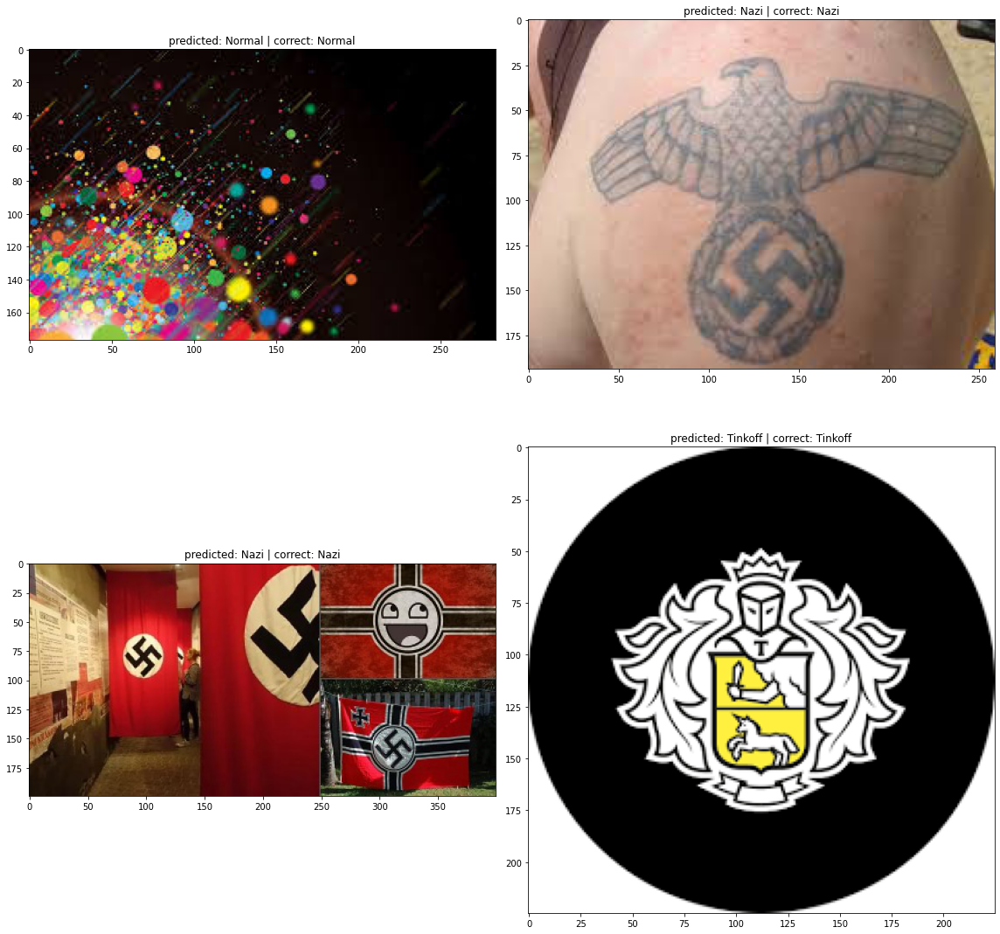

In [30]:
device = utils.get_device()
titles, images = list(zip(*read_random_images(ALL_IMAGES)))
titles = list(map(lambda x: x.rsplit(":")[0], titles))
show_prediction(model, class_names=class_names, titles=titles, images=images, device=device)


## Проверим модель на тестовых данных

мои тестовые данные хранятся в двух папках : \\
test_1.zip и test_2.zip . Тестируем на обоих папках 

In [49]:
%%bash

download-gdrive 15ZwPV2N7lmngNMD-9xUz1W-68j9E6atn test_1.zip
extract-archive test_1.zip &>/dev/null

--2020-05-28 19:05:44--  https://docs.google.com/uc?export=download&confirm=&id=15ZwPV2N7lmngNMD-9xUz1W-68j9E6atn
Resolving docs.google.com (docs.google.com)... 74.125.28.101, 74.125.28.100, 74.125.28.113, ...
Connecting to docs.google.com (docs.google.com)|74.125.28.101|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-10-00-docs.googleusercontent.com/docs/securesc/l3eochv9s0ig8lnahmq762fqo0rrgvf1/lenq7p003sv85jv9ndg7eds6gnlvtban/1590692700000/04303512257475502120/08461318804964426140Z/15ZwPV2N7lmngNMD-9xUz1W-68j9E6atn?e=download [following]
--2020-05-28 19:05:47--  https://doc-10-00-docs.googleusercontent.com/docs/securesc/l3eochv9s0ig8lnahmq762fqo0rrgvf1/lenq7p003sv85jv9ndg7eds6gnlvtban/1590692700000/04303512257475502120/08461318804964426140Z/15ZwPV2N7lmngNMD-9xUz1W-68j9E6atn?e=download
Resolving doc-10-00-docs.googleusercontent.com (doc-10-00-docs.googleusercontent.com)... 74.125.20.132, 2607:f8b0:400e:c07::84
Connecting to doc-1

In [50]:
%%bash
extract-archive test_1.zip &>/dev/null

In [45]:
%%bash

download-gdrive 1WAEkAj1DcgvpzVuS2zWvMN6ApAlQ51aW test_2.zip
extract-archive test_2.zip &>/dev/null

--2020-05-28 19:03:55--  https://docs.google.com/uc?export=download&confirm=&id=1WAEkAj1DcgvpzVuS2zWvMN6ApAlQ51aW
Resolving docs.google.com (docs.google.com)... 74.125.28.139, 74.125.28.102, 74.125.28.113, ...
Connecting to docs.google.com (docs.google.com)|74.125.28.139|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-0c-88-docs.googleusercontent.com/docs/securesc/57genorj0k78qdqqtqvsi735e0hdqggp/mr84ibj3lfig7koclcf59ng38pbqks36/1590692625000/04303512257475502120/01277806379433534145Z/1WAEkAj1DcgvpzVuS2zWvMN6ApAlQ51aW?e=download [following]
--2020-05-28 19:03:56--  https://doc-0c-88-docs.googleusercontent.com/docs/securesc/57genorj0k78qdqqtqvsi735e0hdqggp/mr84ibj3lfig7koclcf59ng38pbqks36/1590692625000/04303512257475502120/01277806379433534145Z/1WAEkAj1DcgvpzVuS2zWvMN6ApAlQ51aW?e=download
Resolving doc-0c-88-docs.googleusercontent.com (doc-0c-88-docs.googleusercontent.com)... 74.125.20.132, 2607:f8b0:400e:c07::84
Connecting to doc-0

In [47]:
from pathlib import Path

TestROOT = "test_1/"
TEST_ALL_IMAGES_1 = list(Path(TestROOT).glob("**/*.*"))
TEST_ALL_IMAGES_1 = list(filter(lambda x: not x.name.startswith("."), TEST_ALL_IMAGES_1))
print("Number of images:", len(TEST_ALL_IMAGES_1))

Number of images: 0


In [48]:
from pathlib import Path

ValROOT = "test_2/"
TEST_ALL_IMAGES_2 = list(Path(ValROOT).glob("**/*.*"))
TEST_ALL_IMAGES_2 = list(filter(lambda x: not x.name.startswith("."), TEST_ALL_IMAGES_2))
print("Number of images:", len(TEST_ALL_IMAGES_2))

NameError: ignored

In [0]:
import warnings
warnings.filterwarnings('ignore')


def testByPath(model, path):
    device = utils.get_device()
    titles, images = list(zip(*read_images(path)))
    titles = list(map(lambda x: x.rsplit(":")[0], titles))
    #show_prediction(model, class_names=class_names, titles=titles, images=images, device=device)
    with torch.no_grad():
        tensor_ = torch.stack([
            valid_transforms(image=image)["image"]
            for image in images
        ]).to(device)
            
                
        logits = model(tensor_)
        probabilities = softmax(logits, dim=1)
        predictions = probabilities.argmax(dim=1) 
        count = 0  
        wrong = []
        for x, title, image in zip(predictions, titles, images):
            if class_names[x] != title :
                wrong += [(x, title, image)]
                count += 1
                print(f"predicted: {class_names[x]} | correct: {title}")
        return count , len(path), wrong

            #(f"predicted: {class_names[x]} | correct: {title}", image)



def test(model):
    count1, len1, wrong1 = testByPath(model, TEST_ALL_IMAGES_1)
    count2, len2, wrong2 = testByPath(model, TEST_ALL_IMAGES_2)
    count = count1 + count2
    size = len1 + len2
    accuracy = (size - count)/size
    print("size : " + str(size))
    print("count : " + str(count))
    print("Accuracy : " + str(accuracy))
    wrong = wrong1 + wrong2
    for item in wrong:
        x, title, image = item
        f, ax = plt.subplots(1, 1, figsize=(8, 8))    
        ax.imshow(image)
        ax.set_title(f"predicted: {class_names[x]} | correct: {title}")
        
    f.tight_layout()


    

test(model)

In [0]:
class_names

In [0]:
torch.save(model.state_dict(), 'CatalystModelWeigh_3.0')



Additionally with SupervisedRunner, you can easily predict entire loader with only one method call. <br/>
The resulting object has shape = (number of elements in the loader, output shape from the model)

In [0]:
predictions = np.vstack(list(map(
    lambda x: x["logits"].cpu().numpy(), 
    runner.predict_loader(loader=loaders["valid"], resume=f"{logdir}/checkpoints/best.pth")
)))
print(predictions.shape)

print("logits: ", predictions[0])

probabilities = torch.softmax(torch.from_numpy(predictions[0]), dim=0)
print("probabilities: ", probabilities)

label = probabilities.argmax().item()
print(f"predicted: {class_names[label]}")

## Model tracing

Catalyst allows you to use Runner to make [tracing](https://pytorch.org/docs/stable/jit.html) models.

> How to do this in the Config API, we wrote in [our blog (issue \#2)](https://github.com/catalyst-team/catalyst-info#catalyst-info-2-tracing-with-torchjit)

For this purpose it is necessary to pass in a method `trace ` model and a batch on which `predict_batch ` will be executed:

In [0]:
batch = next(iter(loaders["valid"]))
# saves to `logdir` and returns a `ScriptModule` class
runner.trace(model=model, batch=batch, logdir=logdir, fp16=is_fp16_used)

!ls {logdir}/trace/

After this, you can easily load the model and predict anything!

In [0]:
from catalyst.dl.utils import trace

if is_fp16_used:
    model = trace.load_traced_model(
        f"{logdir}/trace/traced-forward-opt_O1.pth", 
        device="cuda", 
        opt_level="O1"
    )
else:
    model = trace.load_traced_model(
        f"{logdir}/trace/traced-forward.pth", 
        device="cpu"
    )

In [0]:
model_input = batch["features"].to("cuda" if is_fp16_used else "cpu")
model(model_input)

### Advanced: Custom Callbacks

Let's count the number of predicted labels per class.

In [0]:
import collections

from catalyst.dl import Callback, CallbackOrder, State


class CustomInferCallback(Callback):
  def __init__(self):
    super().__init__(CallbackOrder.Internal)
    self.class_counts = collections.defaultdict(lambda: 0)

  def on_loader_start(self, state: State):
    self.class_counts = collections.defaultdict(lambda: 0)

  def on_batch_end(self, state: State):
    # data from the Dataloader
    # features, targets = state.input["features"], state.input["targets"]
    logits = state.output["logits"]

    labels = logits.argmax(axis=1)
    labels = labels.cpu().detach().numpy().tolist()
    for label in labels:
        self.class_counts[label] += 1


In [0]:
from collections import OrderedDict
from catalyst.dl.callbacks import CheckpointCallback

infer_loaders = {"infer": loaders["valid"]}
model = get_model(model_name, num_classes)

device = utils.get_device()
if is_fp16_used:
    fp16_params = dict(opt_level="O1") # params for FP16
else:
    fp16_params = None

runner = SupervisedRunner(device=device)
runner.infer(
    model=model,
    loaders=infer_loaders,
    callbacks=OrderedDict([
        ("loader", CheckpointCallback(resume=f"{logdir}/checkpoints/best.pth")),
        ("infer", CustomInferCallback())
    ]),
    fp16=fp16_params,
)

In [0]:
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

class_counts = runner.state._callbacks["infer"].class_counts
counts = [class_counts[x] for x in range(len(class_names))]

plt.figure(figsize=(20, 9))
x = np.arange(len(counts))
plt.bar(x + 0.5, height=counts)
plt.xticks(x - 0.3, class_names, rotation=65)
plt.show()

### Advanced: Training with Focal Loss and OneCycle

In the `catalyst.contrib` there are a large number of different additional criterions, models, layers etc

For example,

[catalyst.contrib.criterion](https://catalyst-team.github.io/catalyst/api/contrib.html#module-catalyst.contrib.criterion.ce):
- HuberLoss
- CenterLoss
- FocalLossMultiClass
- DiceLoss / BCEDiceLoss
- IoULoss / BCEIoULoss
- LovaszLossBinary / LovaszLossMultiClass / LovaszLossMultiLabel
- WingLoss

Lr scheduler in [catalyst.contrib.schedulers](https://catalyst-team.github.io/catalyst/api/contrib.html#module-catalyst.contrib.schedulers.base):
- OneCycleLRWithWarmup

Moreover, in [catalyst.contrib.models](https://catalyst-team.github.io/catalyst/api/contrib.html#models) you can find various models for segmentation:
- Unet / ResnetUnet
- Linknet / ResnetLinknet
- FPNUnet / ResnetFPNUnet
- PSPnet / ResnetPSPnet
- MobileUnet


Finally, several handwritten modules in [catalyst.contrib.modules](https://catalyst-team.github.io/catalyst/api/contrib.html#module-catalyst.contrib.modules.common):
- Flatten
- TemporalAttentionPooling
- LamaPooling
- NoisyLinear
- GlobalAvgPool2d / GlobalMaxPool2d
- GlobalConcatPool2d / GlobalAttnPool2d

a bunch of others


But for now, let's take `FocalLoss` and `OneCycleLRWithWarmup` to play around.

In [0]:
from catalyst.contrib.nn import FocalLossMultiClass, OneCycleLRWithWarmup

logdir = "./logs/classification_tutorial_1"
num_epochs = 10

model = get_model(model_name, num_classes)

criterion = FocalLossMultiClass()
optimizer = torch.optim.Adam(model.parameters(), lr=0.0003)
scheduler = OneCycleLRWithWarmup(
    optimizer, 
    num_steps=num_epochs, 
    lr_range=(0.001, 0.0001),
    warmup_steps=1
)

# FocalLoss expects one_hot for the input
# in our Reader function we have already created the conversion of targets in one_hot
# so, all we need - respecify the target key name
runner = SupervisedRunner(input_target_key="targets_one_hot")

In [0]:
runner.train(
    model=model,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    loaders=loaders,
    callbacks=[
        AccuracyCallback(num_classes=num_classes),
        AUCCallback(
            num_classes=num_classes,
            input_key="targets_one_hot",
            class_names=class_names
        ),
        F1ScoreCallback(
            input_key="targets_one_hot",
            activation="Softmax"
        )
    ],
    logdir=logdir,
    num_epochs=num_epochs,
    main_metric="auc/_mean",
    minimize_metric=False,
    fp16=fp16_params,
    verbose=True
)

In [0]:
# it can take a while (colab issue)
utils.plot_metrics(
    logdir=logdir, 
    metrics=["loss", "accuracy01", "auc/_mean", "f1_score", "_base/lr"]
)

In [0]:
device = utils.get_device()
titles, images = list(zip(*read_random_images(ALL_IMAGES)))
titles = list(map(lambda x: x.rsplit(":")[0], titles))
show_prediction(model, class_names=class_names, titles=titles, images=images, device=device)

In [0]:
test(model)

### Advanced:  Balancing classes in the dataset

There are several useful data-sampler implementations in the `catalyst.data.sampler`. For example,
- `BalanceClassSampler` allows you to create stratified sampling on an unbalanced dataset. <br/> A strategy can be either downsampling, upsampling or some prespeficied number of samples per class. <br/> Very important feature for every classification problem.
- `MiniEpochSampler` allows you to split your "very large dataset" and sample some small portion of it every epoch. <br/> This is useful for those cases where you need to check valid metrics and save checkpoints more often. <br/> For example, your 1M images dataset can be sampled in 100k per epoch with all necessary metrics.

In [0]:
from catalyst.data import BalanceClassSampler

logdir = "./logs/classification_tutorial_2"
num_epochs = 10

labels = [x["label"] for x in train_data]
sampler = BalanceClassSampler(labels, mode="upsampling")

# let's re-create our loaders with BalanceClassSampler
loader = get_loaders(open_fn, train_data_transforms, valid_data_transforms, sampler=sampler)

model = get_model(model_name, num_classes)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.0003)
scheduler = OneCycleLRWithWarmup(
    optimizer, 
    num_steps=num_epochs, 
    lr_range=(0.001, 0.0001),
    warmup_steps=1
)

runner = SupervisedRunner()

In [0]:
runner.train(
    model=model,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    loaders=loaders,
    callbacks=[
        AccuracyCallback(num_classes=num_classes),
        AUCCallback(
            num_classes=num_classes,
            input_key="targets_one_hot",
            class_names=class_names
        ),
        F1ScoreCallback(
            input_key="targets_one_hot",
            activation="Softmax"
        )
    ],
    logdir=logdir,
    num_epochs=num_epochs,
    main_metric="auc/_mean",
    minimize_metric=False,
    fp16=fp16_params,
    verbose=True
)

In [0]:
# it can take a while (colab issue)
utils.plot_metrics(
    logdir=logdir, 
    metrics=["loss", "accuracy01", "auc/_mean", "f1_score", "_base/lr"]
)

In [0]:
device = utils.get_device()
titles, images = list(zip(*read_random_images(ALL_IMAGES)))
titles = list(map(lambda x: x.rsplit(":")[0], titles))
show_prediction(model, class_names=class_names, titles=titles, images=images, device=device)

In [0]:
test(model)